In [ ]:
# -*- coding: utf-8 -*-
#  File: otus_pro_hw3.ipynb
#  Project: 'OTUS PRO Homework #3'
#  Created by Gennady Matveev (gm@og.ly) on 17-01-2022.
#  Attributions: This notebook is in large part based on
#  the code providen in lesson #10 OTUS.ML.Pro, adopted 
#  to "Credit Card Fraud Detection" dataset

![OTUS.ML.Pro](https://docs.google.com/uc?export=download&id=1WNdJ3EbDWli0UARUhWLwGmC5_RUuIJ7n)
<!-- https://drive.google.com/file/d/1WNdJ3EbDWli0UARUhWLwGmC5_RUuIJ7n/view?usp=sharing -->

# **$Homework$** **$3$**
**OTUS Machine Learning Professional**

# Anomaly detection

Goals:   
- Apply **anomaly detection** methods to "Credit Card Fraud Detection" dataset
- Carry out basic EDA
- Use anomaly percentage, calculated by "Class" variable, as an "expert estimate" of the dataset "impurity"
- Estimate the quality of models with their predictions and "Class" variable, using classificationrt and confusion matrix
- Check if anomalies are separated from the rest of data with UMAP/t-sne.

Additional goals:  
- Try outlier detection methods from ATOM library (separate notebook)
- Look into PyOD possibilities (separate notebook)
- Apply voting classifier (here and in PyOD)

Means:  
- All meaningful programming will be done in sklearn

Dataset:
- Credit Card Fraud Detection 
https://www.kaggle.com/mlg-ulb/creditcardfraud#creditcard.csv

Abbreviations:
- EDA: exploratory data analysis
- PP: preprocessing
- AD: anomaly detection

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Google-colab-specific-part" data-toc-modified-id="Google-colab-specific-part-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Google colab specific part</a></span></li><li><span><a href="#Import-libraries-and-setup-notebook" data-toc-modified-id="Import-libraries-and-setup-notebook-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import libraries and setup notebook</a></span><ul class="toc-item"><li><span><a href="#Miscellaneous-settings" data-toc-modified-id="Miscellaneous-settings-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Miscellaneous settings</a></span></li><li><span><a href="#ML-parameters" data-toc-modified-id="ML-parameters-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>ML parameters</a></span></li><li><span><a href="#Load-data" data-toc-modified-id="Load-data-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Load data</a></span></li><li><span><a href="#Choose-full-or-partial-data" data-toc-modified-id="Choose-full-or-partial-data-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Choose full or partial data</a></span></li></ul></li><li><span><a href="#Dataset-contamination" data-toc-modified-id="Dataset-contamination-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Dataset contamination</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>EDA</a></span><ul class="toc-item"><li><span><a href="#Histograms" data-toc-modified-id="Histograms-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Histograms</a></span></li><li><span><a href="#Correlations" data-toc-modified-id="Correlations-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Correlations</a></span></li><li><span><a href="#Highly-correlated-features" data-toc-modified-id="Highly-correlated-features-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Highly correlated features</a></span></li><li><span><a href="#Pairplots-of-some-other-features" data-toc-modified-id="Pairplots-of-some-other-features-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Pairplots of some other features</a></span></li></ul></li><li><span><a href="#Quality-check-function" data-toc-modified-id="Quality-check-function-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Quality check function</a></span></li><li><span><a href="#Simple-methods" data-toc-modified-id="Simple-methods-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Simple methods</a></span><ul class="toc-item"><li><span><a href="#Scale-the-data" data-toc-modified-id="Scale-the-data-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Scale the data</a></span></li><li><span><a href="#Distribution-of-distances" data-toc-modified-id="Distribution-of-distances-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Distribution of distances</a></span></li><li><span><a href="#Utility-finctions" data-toc-modified-id="Utility-finctions-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Utility finctions</a></span></li><li><span><a href="#Distance-based" data-toc-modified-id="Distance-based-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Distance-based</a></span><ul class="toc-item"><li><span><a href="#STD---three-(or-even-ten)-sigmas" data-toc-modified-id="STD---three-(or-even-ten)-sigmas-6.4.1"><span class="toc-item-num">6.4.1&nbsp;&nbsp;</span>STD - three (or even ten) sigmas</a></span><ul class="toc-item"><li><span><a href="#Quality-check---STD-(&quot;3-sigmas&quot;)" data-toc-modified-id="Quality-check---STD-(&quot;3-sigmas&quot;)-6.4.1.1"><span class="toc-item-num">6.4.1.1&nbsp;&nbsp;</span>Quality check - STD ("3 sigmas")</a></span></li></ul></li><li><span><a href="#Interquartile-range" data-toc-modified-id="Interquartile-range-6.4.2"><span class="toc-item-num">6.4.2&nbsp;&nbsp;</span>Interquartile range</a></span><ul class="toc-item"><li><span><a href="#Quality-check---IQR" data-toc-modified-id="Quality-check---IQR-6.4.2.1"><span class="toc-item-num">6.4.2.1&nbsp;&nbsp;</span>Quality check - IQR</a></span></li></ul></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-6.4.3"><span class="toc-item-num">6.4.3&nbsp;&nbsp;</span>Clustering</a></span><ul class="toc-item"><li><span><a href="#Euclidean-distance" data-toc-modified-id="Euclidean-distance-6.4.3.1"><span class="toc-item-num">6.4.3.1&nbsp;&nbsp;</span>Euclidean distance</a></span></li><li><span><a href="#Cityblock-distance" data-toc-modified-id="Cityblock-distance-6.4.3.2"><span class="toc-item-num">6.4.3.2&nbsp;&nbsp;</span>Cityblock distance</a></span></li></ul></li></ul></li><li><span><a href="#Density-based" data-toc-modified-id="Density-based-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Density-based</a></span><ul class="toc-item"><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-6.5.1"><span class="toc-item-num">6.5.1&nbsp;&nbsp;</span>DBSCAN</a></span><ul class="toc-item"><li><span><a href="#Quality-check---DBSCAN" data-toc-modified-id="Quality-check---DBSCAN-6.5.1.1"><span class="toc-item-num">6.5.1.1&nbsp;&nbsp;</span>Quality check - DBSCAN</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#Unsupervised-model-based" data-toc-modified-id="Unsupervised-model-based-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Unsupervised model-based</a></span><ul class="toc-item"><li><span><a href="#One-Class-SVM" data-toc-modified-id="One-Class-SVM-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>One-Class SVM</a></span><ul class="toc-item"><li><span><a href="#Quality-check---OneClassSVM" data-toc-modified-id="Quality-check---OneClassSVM-7.1.1"><span class="toc-item-num">7.1.1&nbsp;&nbsp;</span>Quality check - OneClassSVM</a></span></li></ul></li><li><span><a href="#Isolation-Forest" data-toc-modified-id="Isolation-Forest-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Isolation Forest</a></span><ul class="toc-item"><li><span><a href="#Quality-check---iForest" data-toc-modified-id="Quality-check---iForest-7.2.1"><span class="toc-item-num">7.2.1&nbsp;&nbsp;</span>Quality check - iForest</a></span></li></ul></li></ul></li><li><span><a href="#Methods-comparison" data-toc-modified-id="Methods-comparison-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Methods comparison</a></span><ul class="toc-item"><li><span><a href="#All-combined-(average-score)" data-toc-modified-id="All-combined-(average-score)-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>All combined (average score)</a></span><ul class="toc-item"><li><span><a href="#Quality-check---all-models-average" data-toc-modified-id="Quality-check---all-models-average-8.1.1"><span class="toc-item-num">8.1.1&nbsp;&nbsp;</span>Quality check - all models average</a></span></li></ul></li><li><span><a href="#Only-model-based" data-toc-modified-id="Only-model-based-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Only model-based</a></span><ul class="toc-item"><li><span><a href="#Quality-check---model-based" data-toc-modified-id="Quality-check---model-based-8.2.1"><span class="toc-item-num">8.2.1&nbsp;&nbsp;</span>Quality check - model-based</a></span></li></ul></li></ul></li><li><span><a href="#Comparison-of-results---classification-reports" data-toc-modified-id="Comparison-of-results---classification-reports-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Comparison of results - classification reports</a></span></li></ul></div>

<a href="https://colab.research.google.com/github/oort77/OTUS_PRO_HW3/blob/main/notebooks/otus_pro_hw3_sklearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a> 

## Google colab specific part

Please uncomment and run the cell below to install dependencies.  Restart of runtime is required after installation.
Typical runtime on colab is around 30 minutes (to include installation of libraries ~ 2-3 minutes).

In [ ]:
# !pip install -r "https://drive.google.com/uc?export=download&id=14TOXCFVR7VPnfNiKimcz-BUUaJastb4h"

## Import libraries and setup notebook

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, \
    MinMaxScaler, RobustScaler
from sklearn.base import BaseEstimator
from sklearn.cluster import DBSCAN
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

import scipy.stats as stats
from scipy.spatial.distance import cdist
from scipy.spatial.distance import pdist
from umap import UMAP
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import random
import re
import gdown
from IPython.core.display import display, HTML
import warnings

### Miscellaneous settings 

In [ ]:
%matplotlib inline
display(HTML("<style>.container {width:80% !important; }</style>"))
# %config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (12, 4)
plt.style.use('seaborn')
sns.set(rc={'figure.figsize': (12, 4)})
warnings.filterwarnings("ignore")
pd.options.display.precision = 4
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

### ML parameters

In [ ]:
random_state = 42
n_jobs = 2 # <-- for colab
# n_jobs = 6 # for local runs

### Load data

In [ ]:
# Local file
# data = pd.read_csv("../data/archive.zip", compression="zip")

# From Google Drive
!mkdir ../data
url = "https://drive.google.com/uc?id=1Na6k8qB2aIoHQJeXAnCQXG6gDb6W6MtS"
data = pd.read_csv(gdown.download(
    url, output="../data/archive.zip", quiet=True), compression="zip")

# Through away "Time" column
data = data.astype("float32").iloc[:, 1:]
data.head()

mkdir: cannot create directory ‘../data’: File exists


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.3598,-0.0728,2.5363,1.3782,-0.3383,0.4624,0.2396,0.0987,0.3638,0.0908,-0.5516,-0.6178,-0.9914,-0.3112,1.4682,-0.4704,0.2080,0.0258,0.4040,0.2514,-0.0183,0.2778,-0.1105,0.0669,0.1285,-0.1891,0.1336,-0.0211,149.62,0.0
1,1.1919,0.2662,0.1665,0.4482,0.0600,-0.0824,-0.0788,0.0851,-0.2554,-0.1670,1.6127,1.0652,0.4891,-0.1438,0.6356,0.4639,-0.1148,-0.1834,-0.1458,-0.0691,-0.2258,-0.6387,0.1013,-0.3398,0.1672,0.1259,-0.0090,0.0147,2.69,0.0
2,-1.3584,-1.3402,1.7732,0.3798,-0.5032,1.8005,0.7915,0.2477,-1.5147,0.2076,0.6245,0.0661,0.7173,-0.1659,2.3459,-2.8901,1.1100,-0.1214,-2.2619,0.5250,0.2480,0.7717,0.9094,-0.6893,-0.3276,-0.1391,-0.0554,-0.0598,378.66,0.0
3,-0.9663,-0.1852,1.7930,-0.8633,-0.0103,1.2472,0.2376,0.3774,-1.3870,-0.0550,-0.2265,0.1782,0.5078,-0.2879,-0.6314,-1.0596,-0.6841,1.9658,-1.2326,-0.2080,-0.1083,0.0053,-0.1903,-1.1756,0.6474,-0.2219,0.0627,0.0615,123.50,0.0
4,-1.1582,0.8777,1.5487,0.4030,-0.4072,0.0959,0.5929,-0.2705,0.8177,0.7531,-0.8228,0.5382,1.3459,-1.1197,0.1751,-0.4514,-0.2370,-0.0382,0.8035,0.4085,-0.0094,0.7983,-0.1375,0.1413,-0.2060,0.5023,0.2194,0.2152,69.99,0.0


### Choose full or partial data

In [ ]:
rand_part = 0.1  # for testing of computationally expensive parts
partial = 1
# Randomly select rand_part of rows
part = sorted(random.choices(
    range(data.shape[0]), k=int(data.shape[0]*rand_part)))

if partial == 0:
    data = data.copy()
else:
    data = data.iloc[part]
    data.reset_index(drop=True, inplace=True)

## Dataset contamination

In [ ]:
print(np.unique(data["Class"],return_counts=True))
data["Class"].describe().T

(array([0., 1.], dtype=float32), array([28435,    45]))


count    28480.0000
mean         0.0016
std          0.0397
min          0.0000
25%          0.0000
50%          0.0000
75%          0.0000
max          1.0000
Name: Class, dtype: float64

<div class="alert alert-block alert-success">
<b>"Class"</b> column contains 492 fraud values, only 0.17% of the whole dataset. We will use this number as an "expert estimate".
</div>

## EDA

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
V1,28480.0,-2.0697e-02,2.0261,-37.5581,-0.9167,0.0041,1.3134,2.4127
V2,28480.0,-1.1084e-02,1.7244,-50.3833,-0.6037,0.0673,0.7980,17.9305
V3,28480.0,-6.7707e-03,1.5254,-32.4542,-0.8970,0.1784,1.0174,3.9250
V4,28480.0,-1.3653e-02,1.4161,-5.0241,-0.8639,-0.0335,0.7275,11.9062
V5,28480.0,1.5087e-03,1.3810,-35.1821,-0.6853,-0.0483,0.6168,24.3635
V6,28480.0,1.4626e-03,1.3250,-16.1072,-0.7584,-0.2673,0.4002,21.5505
V7,28480.0,6.2270e-03,1.2462,-33.2393,-0.5465,0.0402,0.5728,36.8774
V8,28480.0,-7.0511e-03,1.1770,-26.7175,-0.2047,0.0225,0.3199,18.2822
V9,28480.0,7.4401e-03,1.1012,-10.8425,-0.6343,-0.0470,0.6089,10.3261
V10,28480.0,3.2468e-03,1.0940,-22.1871,-0.5328,-0.0965,0.4518,13.2494


### Histograms

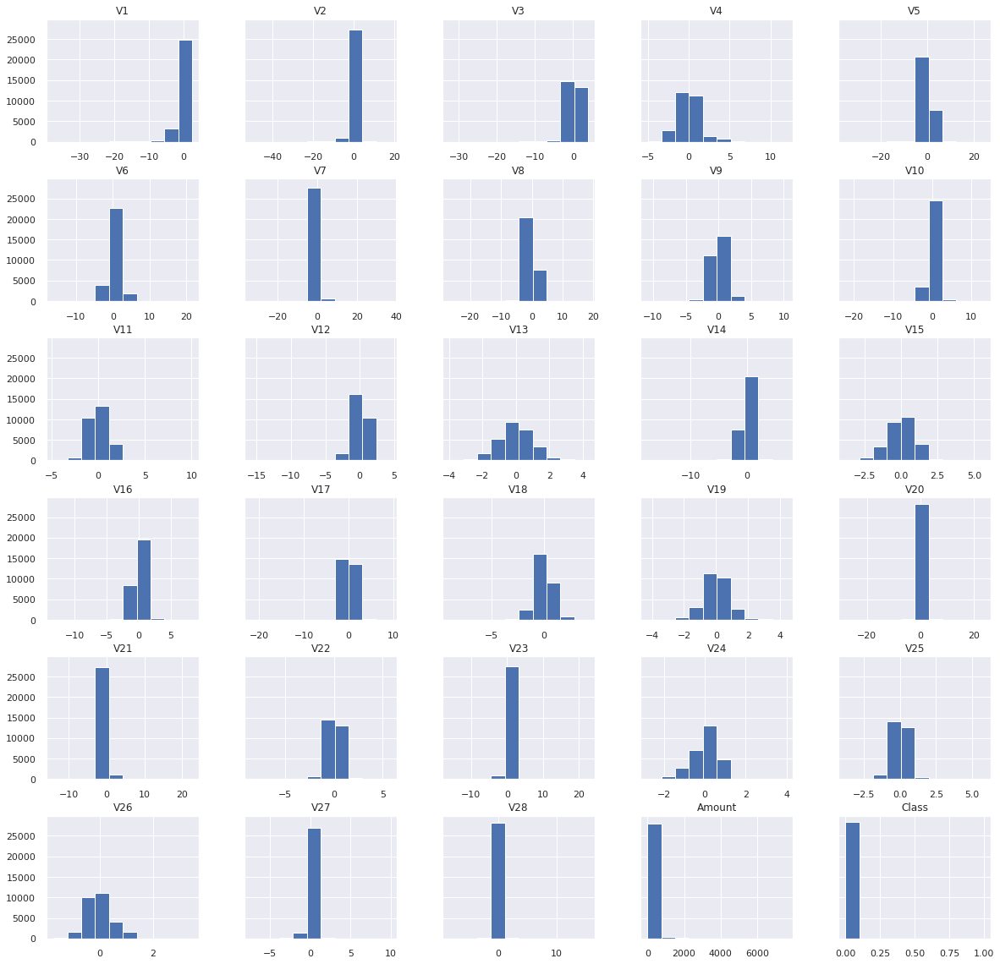

In [ ]:
_ = data.hist(bins=10, sharey=True, figsize=(20, 20))

### Correlations

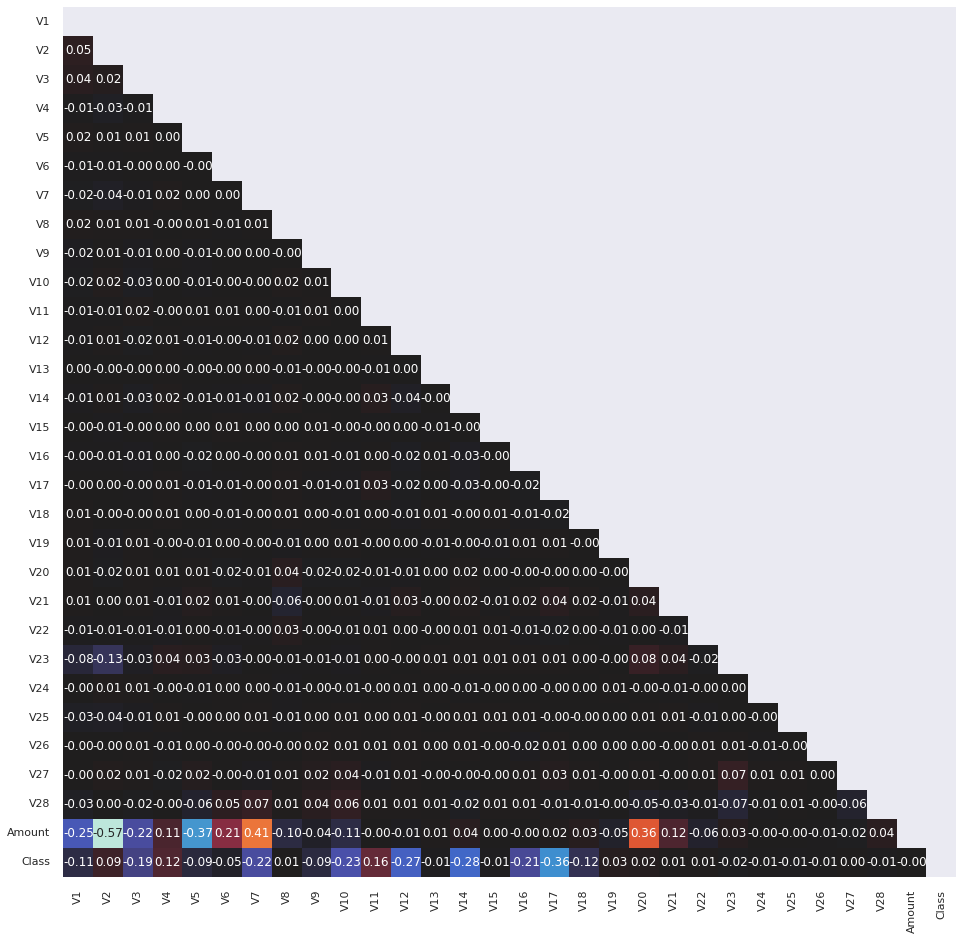

In [ ]:
plt.figure(figsize=(16, 16))

corr_matrix = data.corr()
lower = corr_matrix.where(
    np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))

_ = sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0)

### Highly correlated features

In [ ]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6) | (lower[column] < -0.4))
]

In [ ]:
other_features = [
    col for col in data.columns if col not in high_corr and col != 'show']

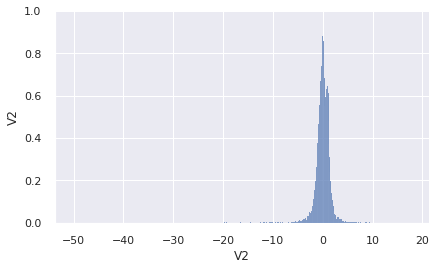

In [ ]:
_ = sns.pairplot(data[high_corr], height=3.8, aspect=1.62)

### Pairplots of some other features

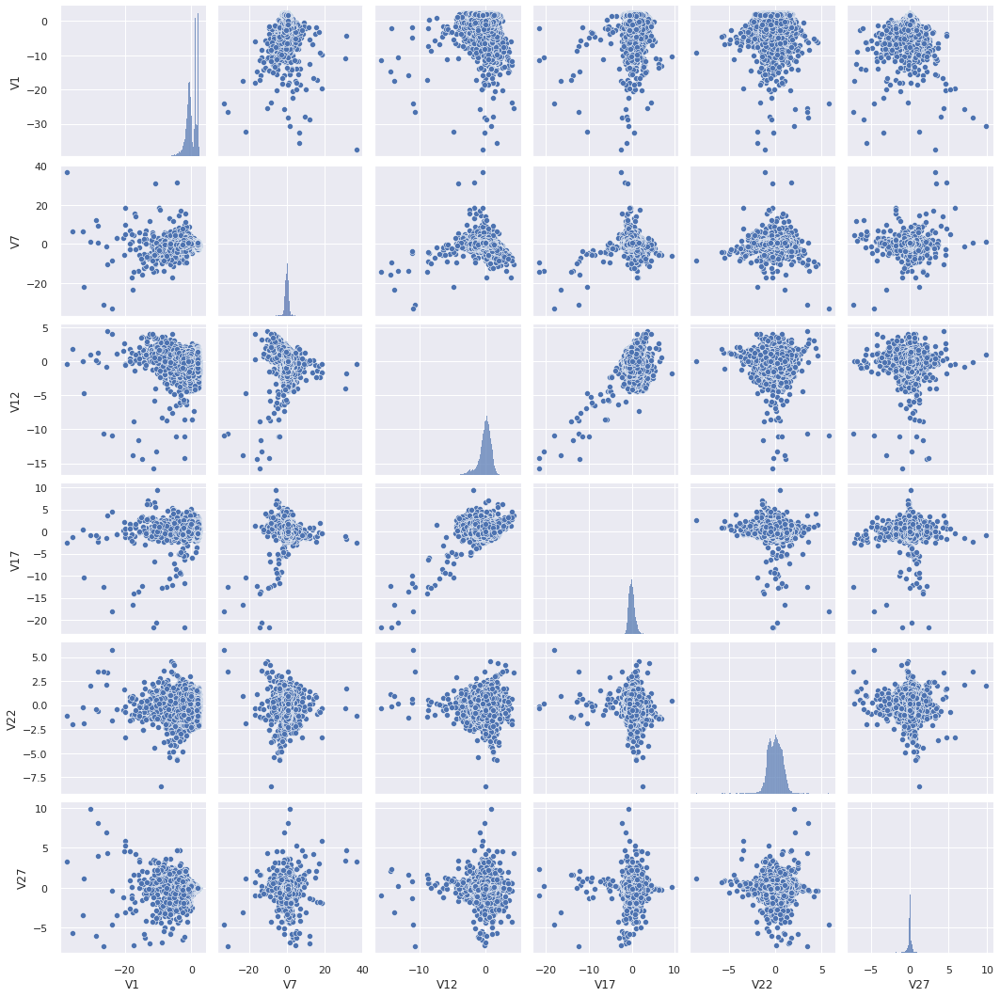

In [ ]:
_ = sns.pairplot(data[other_features[::5]])

## Quality check function

In [ ]:
# Collect confusion matrices
crs = []
def quality_check(y_true, yhat, name):
    print("Confusion matrix:\n")
    cm = confusion_matrix(y_true, yhat)#, normalize="all")
    print(cm)
    disp = ConfusionMatrixDisplay(cm)#.from_predictions
    disp.plot()
    plt.show()
    print("\n-----------------------------------------------------")
    print("\nClassification report:\n")
    cr = classification_report(y_true, yhat)
    print(cr)
    crs.append({name: cr})


## Simple methods

### Scale the data

In [ ]:
data["Amount"] = np.log1p(data["Amount"])

In [ ]:
data_features = data.iloc[:, :-1]
# scaler = RobustScaler()
# scaler = StandardScaler()
scaler = MinMaxScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features),
    columns=data_features.columns
)

### Distribution of distances

In [ ]:
distr = pdist(scaled_data.loc[::100])

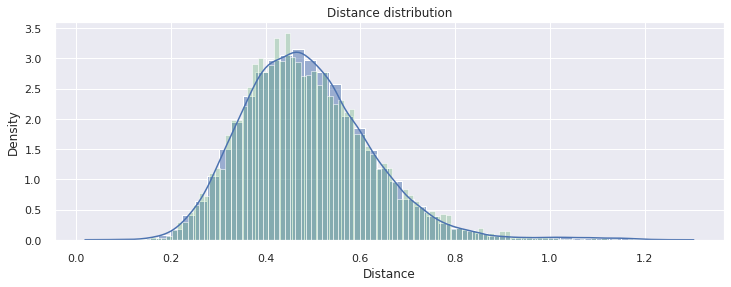

In [ ]:
fig, ax = plt.subplots()
plt.setp(ax, xlabel="Distance")
plt.setp(ax, title="Distance distribution")
sns.histplot(data=distr, bins=50, stat='density', kde=True)
logn_params = stats.lognorm.fit(distr, loc=0.6)
rv = stats.lognorm(*logn_params)
x = np.linspace(0, 2, 50)
rv_pdf = stats.lognorm.pdf(x,*logn_params)
r = stats.lognorm.rvs(*logn_params, 10000)
sns.histplot(r, bins=100, color="g", stat='density', alpha=0.3) 
plt.show()

<div class="alert alert-block alert-success">
<b>"Long tail: "</b>Most distances are below 0.75, but the tail values go well beyond 1.5. Lognorm distribution (green) is a good fit, and it has a heavy right tail.
</div>

### Utility finctions

In [ ]:
def pairplot_with_ouliers(data, color_data, title):
    labeled_data = data.copy()
    labeled_data['is_outlier'] = color_data.copy()
    cols = ['V1', 'V6', 'V11', 'V16',
            'V21', 'V26', 'Amount']
    featured_columns = cols.copy()
    cols.append('is_outlier')

    _ = sns.pairplot(data=labeled_data[cols],
                     vars=featured_columns, hue='is_outlier',
                     hue_order=[1, 0], markers=['X', 'o'],
                     palette='bright')
    plt.suptitle(title, y=1.02, fontsize=20)

In [ ]:
def visualize_2d(data, color_data, title):
    features = data.copy()
    n_features = features.shape[1]

    # UMAP-transform feature space
    umap = UMAP(n_components=2, init='random',
                n_jobs=n_jobs, random_state=random_state)
    proj = umap.fit_transform(features)

    fig = px.scatter(
        proj, x=0, y=1,
        color=color_data.astype("str"),
        labels={'color': 'Outliers'},
        title=title,
        width=720, height=480,
        template="seaborn",
        color_discrete_sequence=px.colors.qualitative.Dark24
    )
    fig.update_traces(marker_size=5)
    fig.show()

### Distance-based

#### STD - three (or even ten) sigmas

<div class="alert alert-block alert-success">
<b>What is 0.17%?</b> Z-table value for normal distribution is approximately 3.1 sigma. Trial runs show that this threshold picks up way more outliers than 0.17%, an we have to pump it way up. 15 seems to be a reasonable choice. 
</div>

In [ ]:
threshold = 15

In [ ]:
def outlier_std(data, col, threshold=threshold):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat(
        [data[col] > up_bound, data[col] < low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [ ]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=threshold):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns

    outliers = pd.Series(data=[False]*len(data),
                         index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(
            data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound,
                                    sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True

    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns = [
        'upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(
        by='anomalies_percentage', ascending=False)

    return comparison_table, outliers


def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
        sum(outliers), 100*sum(outliers)/len(outliers)))

In [ ]:
data_features.reset_index(drop=True, inplace=True)
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 83
Percentage of outliers:   0.29%


##### Quality check - STD ("3 sigmas")

Confusion matrix:

[[28364    71]
 [   33    12]]


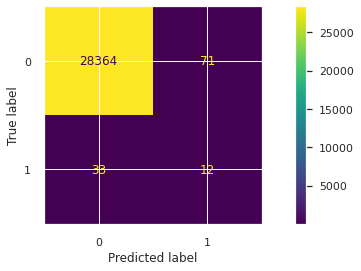


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.14      0.27      0.19        45

    accuracy                           1.00     28480
   macro avg       0.57      0.63      0.59     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
quality_check(data["Class"], std_outliers, name="STD")

In [ ]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
V23,9.5794,-9.5704,21.0,0.0737
V21,11.3216,-11.3147,19.0,0.0667
V28,5.3448,-5.3417,19.0,0.0667
V8,17.6485,-17.6626,13.0,0.0456
V20,12.2942,-12.2920,12.0,0.0421
V27,6.0017,-5.9983,11.0,0.0386
V17,12.4246,-12.4258,10.0,0.0351
V2,25.8550,-25.8772,8.0,0.0281
V7,18.6994,-18.6870,7.0,0.0246
V1,30.3703,-30.4117,6.0,0.0211


Too many features for pairplot, show only seven columns

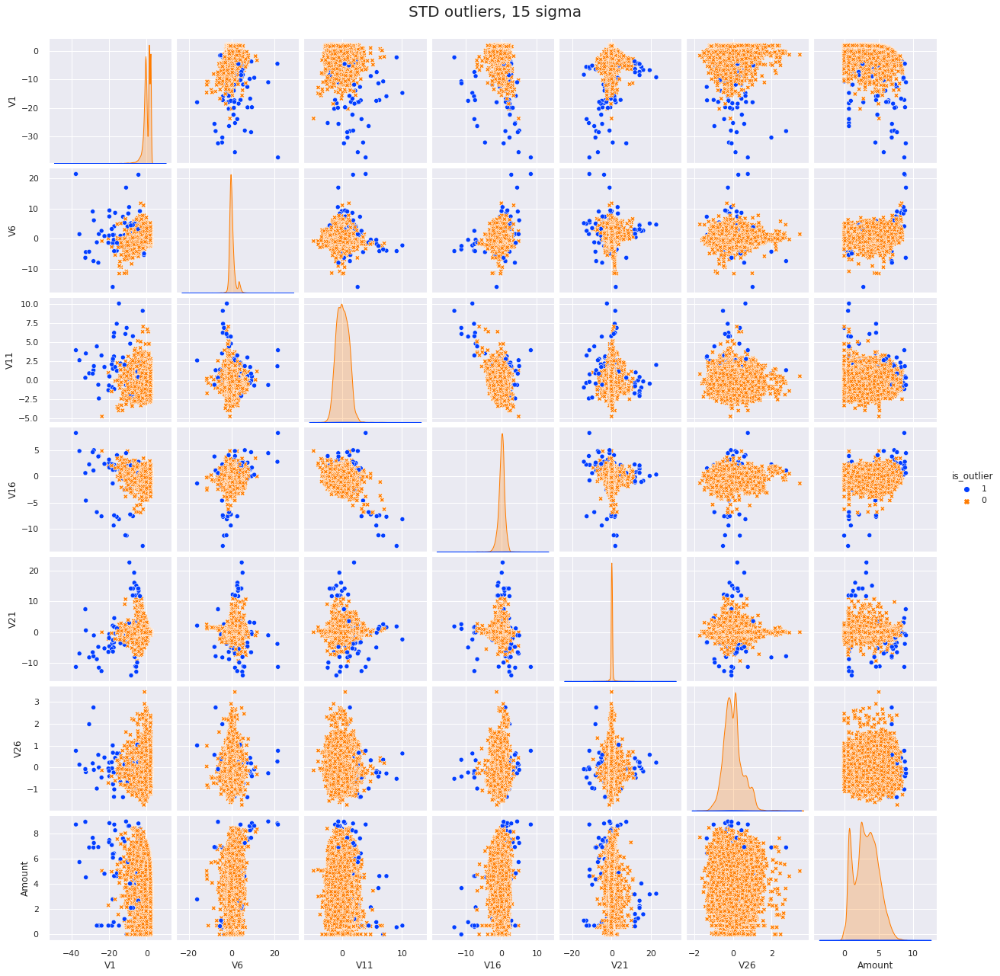

In [ ]:
pairplot_with_ouliers(data_features, std_outliers,
                      title=f"STD outliers, {threshold} sigma")

#### Interquartile range

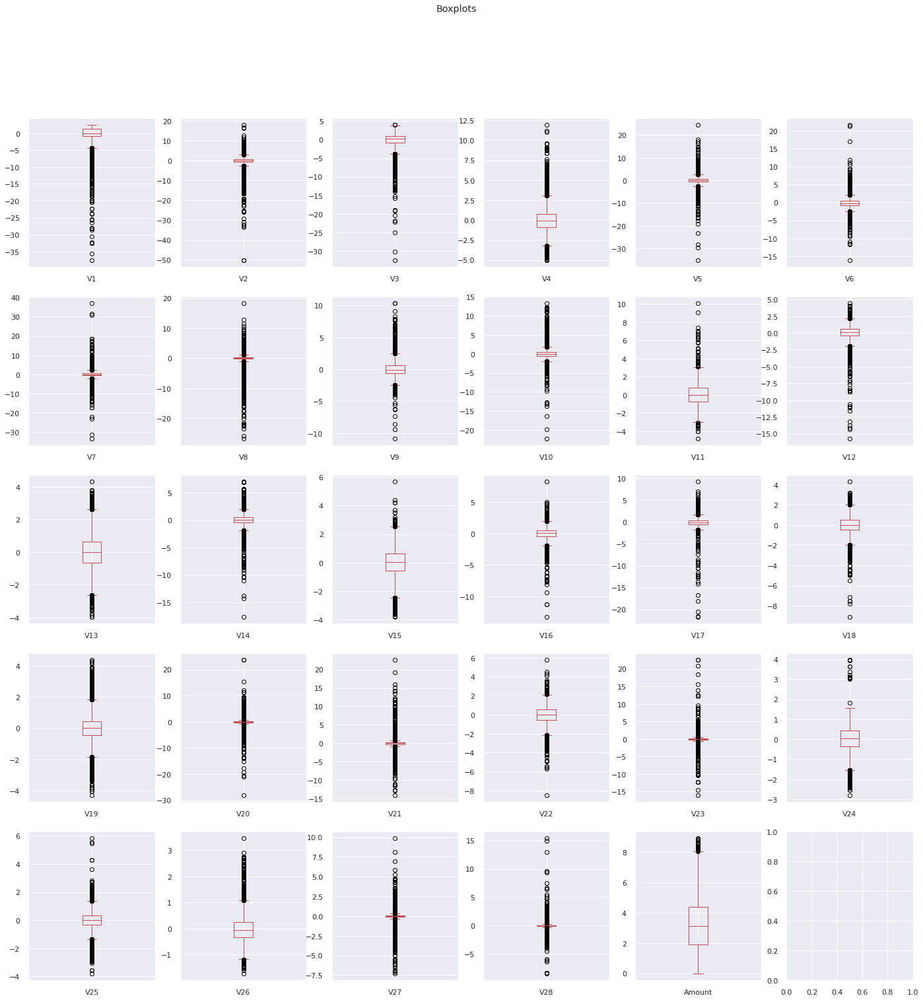

In [ ]:
n_features = data_features.shape[1]
fig, axes = plt.subplots(5, n_features//5+1, figsize=(24, 24))
fig.suptitle('Boxplots')

row = 0
col = 0

for ax, feature in enumerate(data_features):
    data_features[feature].plot.box(ax=axes[row, col], color="r")
    col += 1
    if col > 5:
        row += 1
        col = 0

In [ ]:
def outlier_iqr(data, col, threshold=threshold):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat(
        [data[col] > up_bound, data[col] < low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [ ]:
comparison_table, iqr_outliers = get_column_outliers(
    data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 350
Percentage of outliers:   1.23%


#####  Quality check - IQR

Confusion matrix:

[[28095   340]
 [   35    10]]


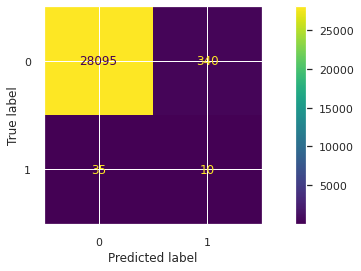


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99     28435
         1.0       0.03      0.22      0.05        45

    accuracy                           0.99     28480
   macro avg       0.51      0.61      0.52     28480
weighted avg       1.00      0.99      0.99     28480



In [ ]:
quality_check(data["Class"], iqr_outliers, "IQR")

In [ ]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
V27,2.5310,-2.5082,118.0,0.4143
V8,8.1890,-8.0738,115.0,0.4038
V20,5.3653,-5.4403,102.0,0.3581
V28,2.0718,-2.0444,91.0,0.3195
V21,6.4378,-6.4778,68.0,0.2388
V23,4.7809,-4.7942,61.0,0.2142
V2,21.8233,-21.6290,12.0,0.0421
V7,17.3635,-17.3372,11.0,0.0386
V17,13.6039,-13.6858,6.0,0.0211
V5,20.1483,-20.2168,5.0,0.0176


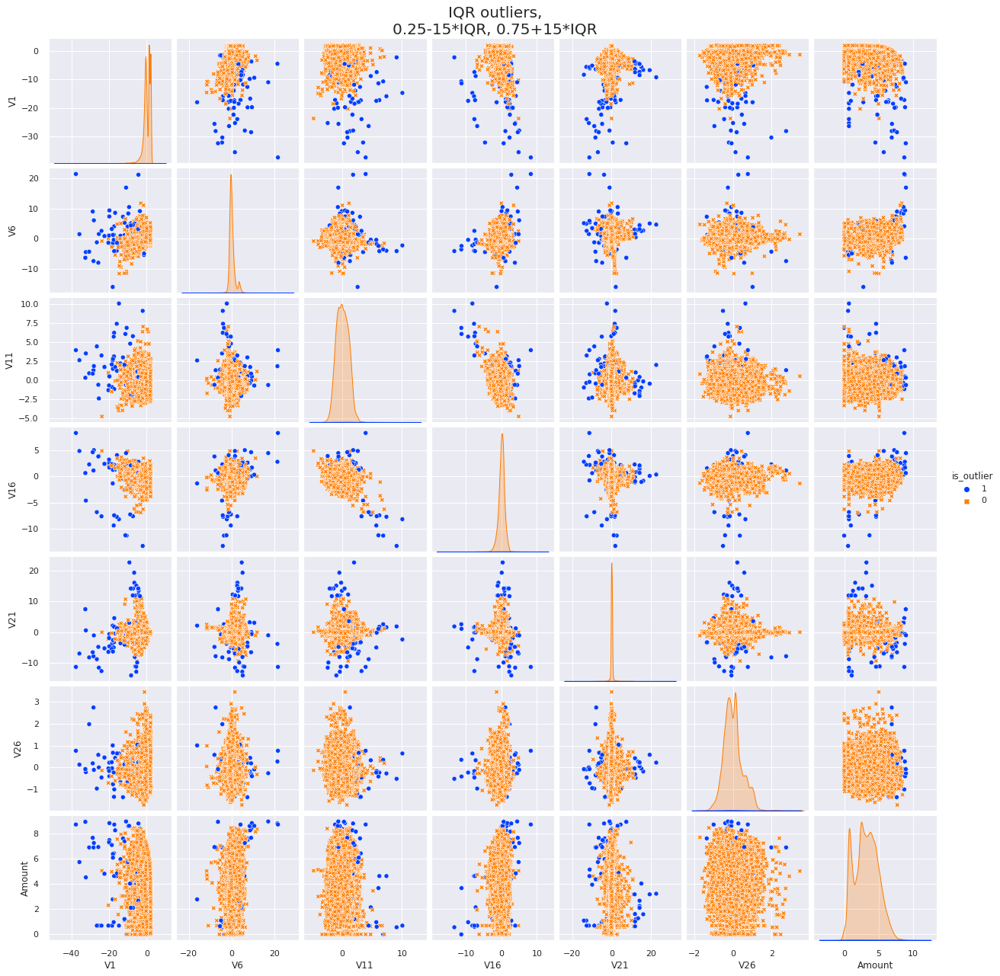

In [ ]:
pairplot_with_ouliers(data_features, std_outliers,
                      title=f"IQR outliers,\n0.25-{threshold}*IQR, 0.75+{threshold}*IQR")

#### Clustering

In [ ]:
class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:

    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)

    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """

    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile

    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(
            self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)

    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

#####  Euclidean distance

In [ ]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=99.5)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)
labeled_data = data_features.copy()
labeled_data['is_outlier'] = euclidian_outliers

Total number of outliers: 142
Percentage of outliers:   0.50%


###### Quality check - Euclidian distance

Confusion matrix:

[[28326   109]
 [   12    33]]


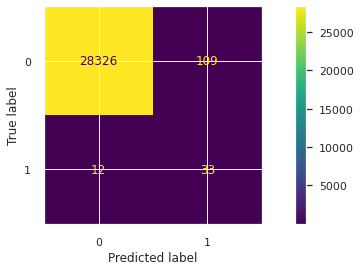


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.23      0.73      0.35        45

    accuracy                           1.00     28480
   macro avg       0.62      0.86      0.68     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
quality_check(data["Class"], euclidian_outliers, "Euclidian distance")

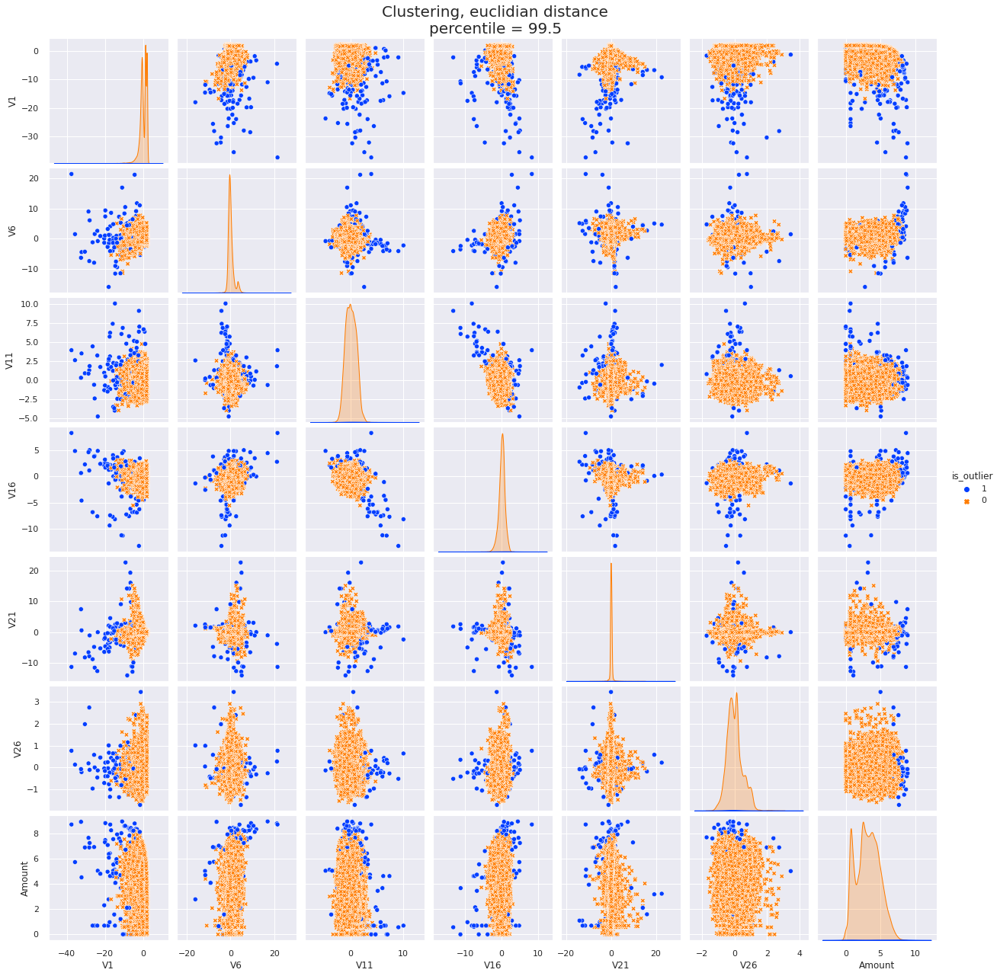

In [ ]:
pairplot_with_ouliers(data, euclidian_outliers,
                      title=f"Clustering, euclidean distance\npercentile = 99.5")

In [ ]:
visualize_2d(labeled_data, labeled_data['is_outlier'],
             title="Clustering with euclidean distance")

##### Cityblock distance

In [ ]:
cityblock_model = DistanceOutliers(metric='cityblock', percentile=99.5)
cityblock_model.fit(scaled_data)
cityblock_outliers = cityblock_model.predict(scaled_data)
anomalies_report(cityblock_outliers)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

Total number of outliers: 142
Percentage of outliers:   0.50%


###### Quality check - Cityblock distance

Confusion matrix:

[[28324   111]
 [   14    31]]


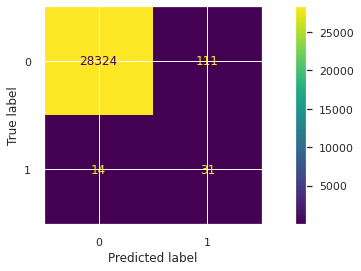


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.22      0.69      0.33        45

    accuracy                           1.00     28480
   macro avg       0.61      0.84      0.66     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
quality_check(data["Class"], cityblock_outliers, "Cityblock distance")

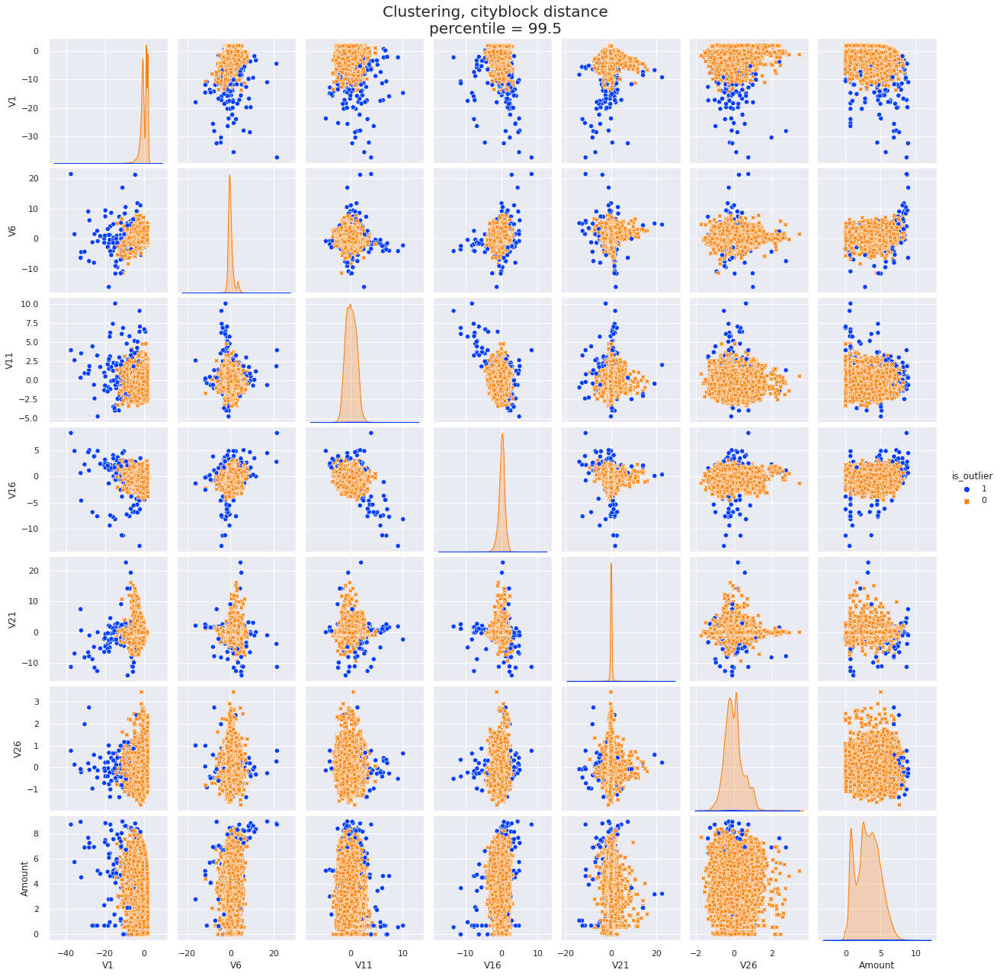

In [ ]:
pairplot_with_ouliers(data, cityblock_outliers,
                      title=f"Clustering, cityblock distance\npercentile = 99.5")

In [ ]:
visualize_2d(labeled_data, labeled_data['is_outlier'],
             title="Clustering with cityblock distance")

### Density-based

#### DBSCAN

In [ ]:
# %%script false --no-raise-error

# Set all recodes as inliers
outlier_percentage = 1.0

num_clusters = []
anomaly_percentage = []

# Begin with an eps value from the beginning of distances tail 
# and then start increasing it
eps = 0.30
eps_history = [eps]
while outlier_percentage > 0.00173:
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # Calculate anomalies percentage
    outlier_percentage = sum(labels == 1) / len(labels)
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    print(anomaly_percentage[-1])

model = DBSCAN(eps)
model.fit(scaled_data)
density_outliers = np.array(
    [1 if label == -1 else 0 for label in model.labels_])

0.01523876404494382
0.008637640449438202
0.004740168539325843
0.0027036516853932583
0.0019311797752808988
0.0014044943820224719


In [ ]:
# %%script false --no-raise-error

anomalies_report(density_outliers)

Total number of outliers: 26
Percentage of outliers:   0.09%


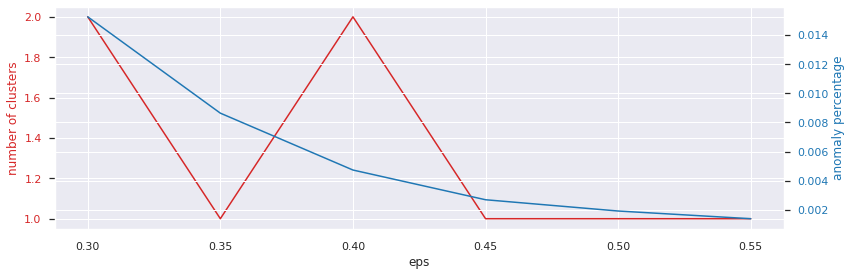

In [ ]:
# %%script false --no-raise-error

iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('eps')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.show()

##### Quality check - DBSCAN

Confusion matrix:

[[28417    18]
 [   37     8]]


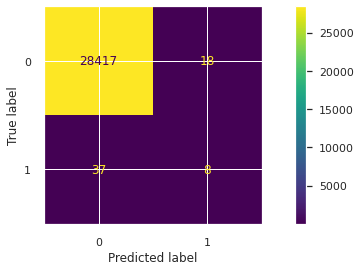


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.31      0.18      0.23        45

    accuracy                           1.00     28480
   macro avg       0.65      0.59      0.61     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
# %%script false --no-raise-error

quality_check(data["Class"], density_outliers, "DBSCAN")

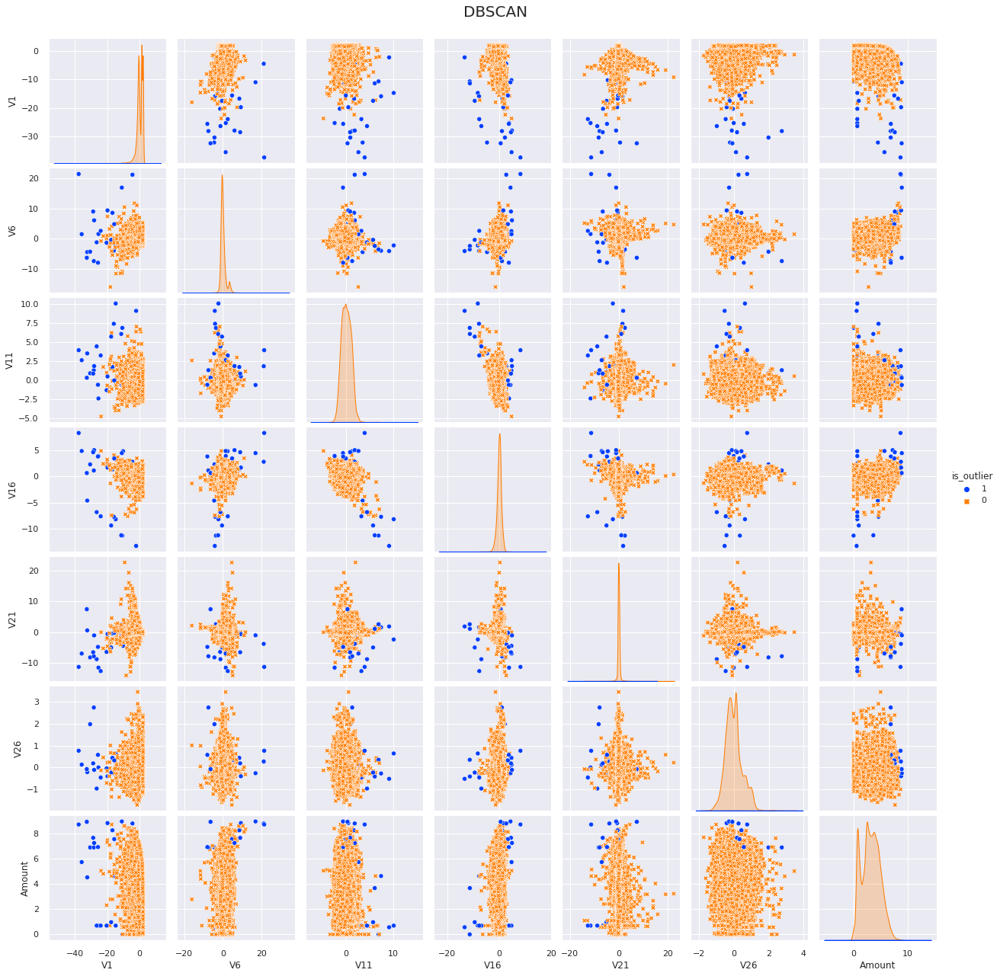

In [ ]:
# %%script false --no-raise-error

labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outliers

pairplot_with_ouliers(labeled_data, labeled_data['is_outlier'],
                      title="DBSCAN")

## Unsupervised model-based

### One-Class SVM

In [ ]:
one_class_svm = OneClassSVM(nu=0.00173, gamma="auto")
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [ ]:
anomalies_report(svm_outliers)

Total number of outliers: 51
Percentage of outliers:   0.18%


#### Quality check - OneClassSVM

Confusion matrix:

[[28396    39]
 [   33    12]]


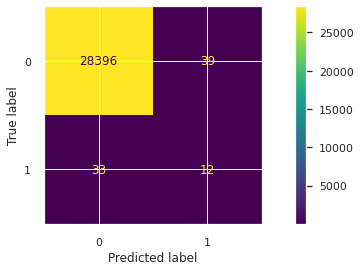


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.24      0.27      0.25        45

    accuracy                           1.00     28480
   macro avg       0.62      0.63      0.62     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
quality_check(data["Class"], svm_outliers, "OneClassSVM")

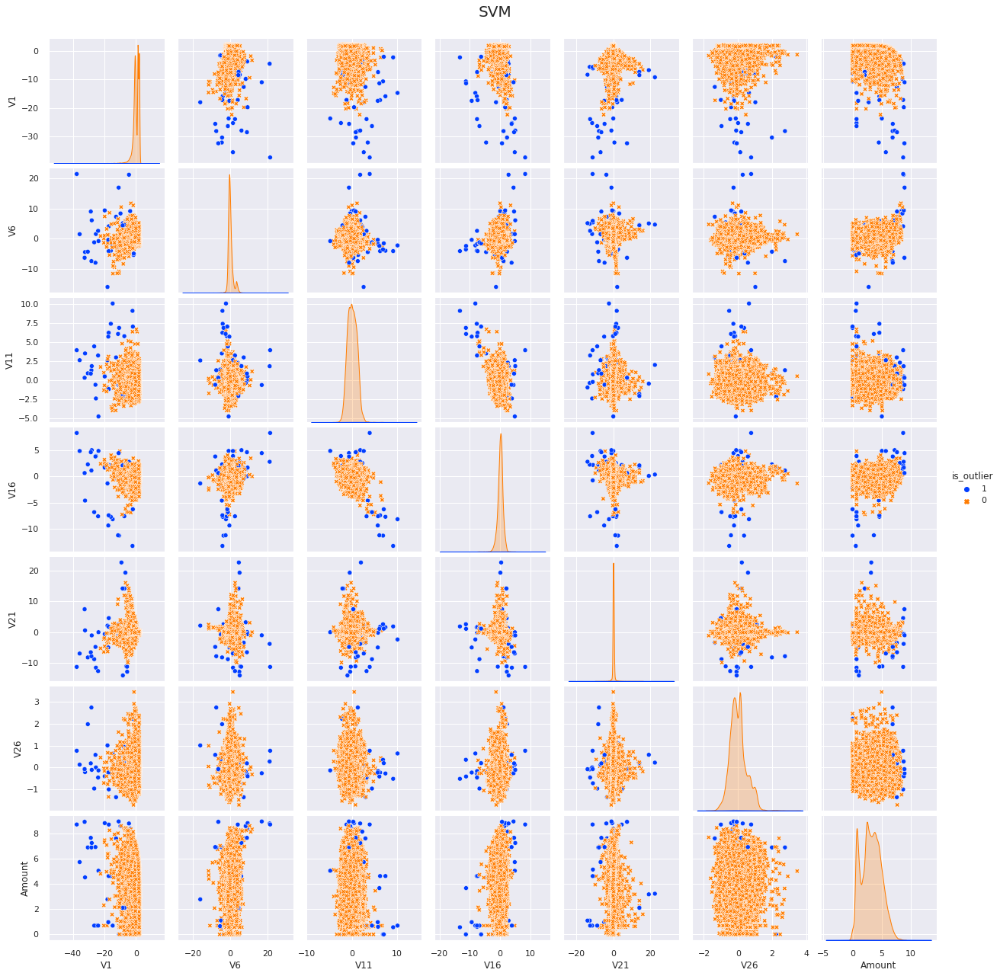

In [ ]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

pairplot_with_ouliers(labeled_data, labeled_data['is_outlier'],
                      title="SVM")

### Isolation Forest

In [ ]:
isolation_forest = IsolationForest(n_estimators=100, contamination=0.00173,
                                   max_features=1.0, bootstrap=True)
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array(
    [1 if label == -1 else 0 for label in isolation_outliers])

In [ ]:
anomalies_report(isolation_outliers)

Total number of outliers: 50
Percentage of outliers:   0.18%


#### Quality check - iForest

Confusion matrix:

[[28397    38]
 [   33    12]]


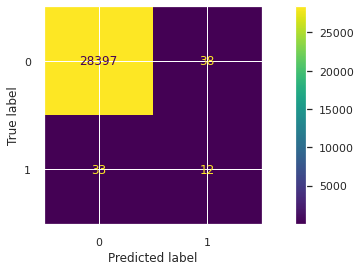


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.24      0.27      0.25        45

    accuracy                           1.00     28480
   macro avg       0.62      0.63      0.63     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
quality_check(data["Class"], isolation_outliers,"iForest")

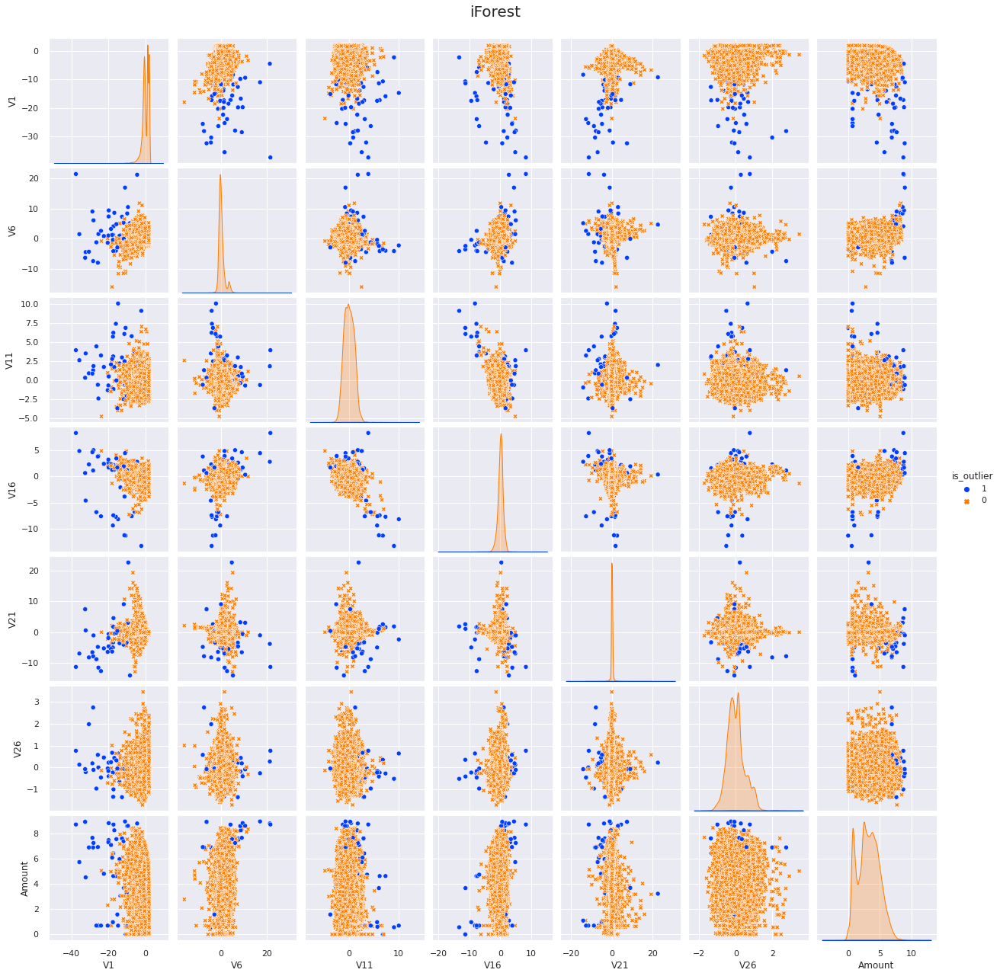

In [ ]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

pairplot_with_ouliers(data, isolation_outliers,
                      title="iForest")

## Methods comparison

In [ ]:
summary_ = np.concatenate((
    [std_outliers],
    [iqr_outliers],
    [euclidian_outliers],
    [cityblock_outliers],
    [density_outliers],
    [svm_outliers],
    [isolation_outliers]
))

In [ ]:
summary = pd.DataFrame(
    summary_.T,
    columns=['STD', 'IQR', 'Euclid', 'Cityblock', 'DBSCAN', 'OCSVM', 'iForest']
)
summary.head()

,STD,IQR,Euclid,Cityblock,DBSCAN,OCSVM,iForest
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0


In [ ]:
summary.sum(axis=1).value_counts()

0    28084
1      233
2       53
3       41
5       23
7       21
4       15
6       10
dtype: int64

Mean outliers score for the dataset: 0.004233547351524874


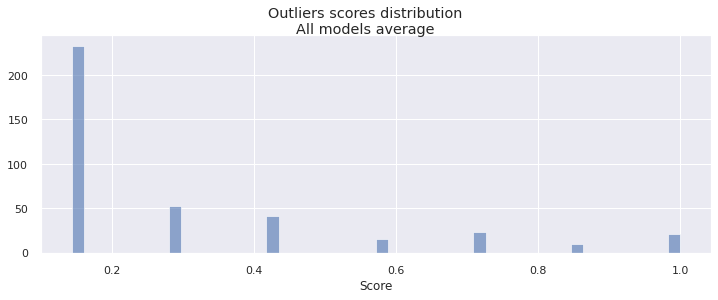

In [ ]:
outliers_score = summary.mean(axis=1)
all_non_zero = outliers_score[outliers_score > 0]
_ = plt.hist(all_non_zero, bins=50, alpha=0.6)
plt.suptitle("Outliers scores distribution\nAll models average")
plt.xlabel("Score")
print(f"Mean outliers score for the dataset: {outliers_score.apply('mean')}")

### All combined (average score)

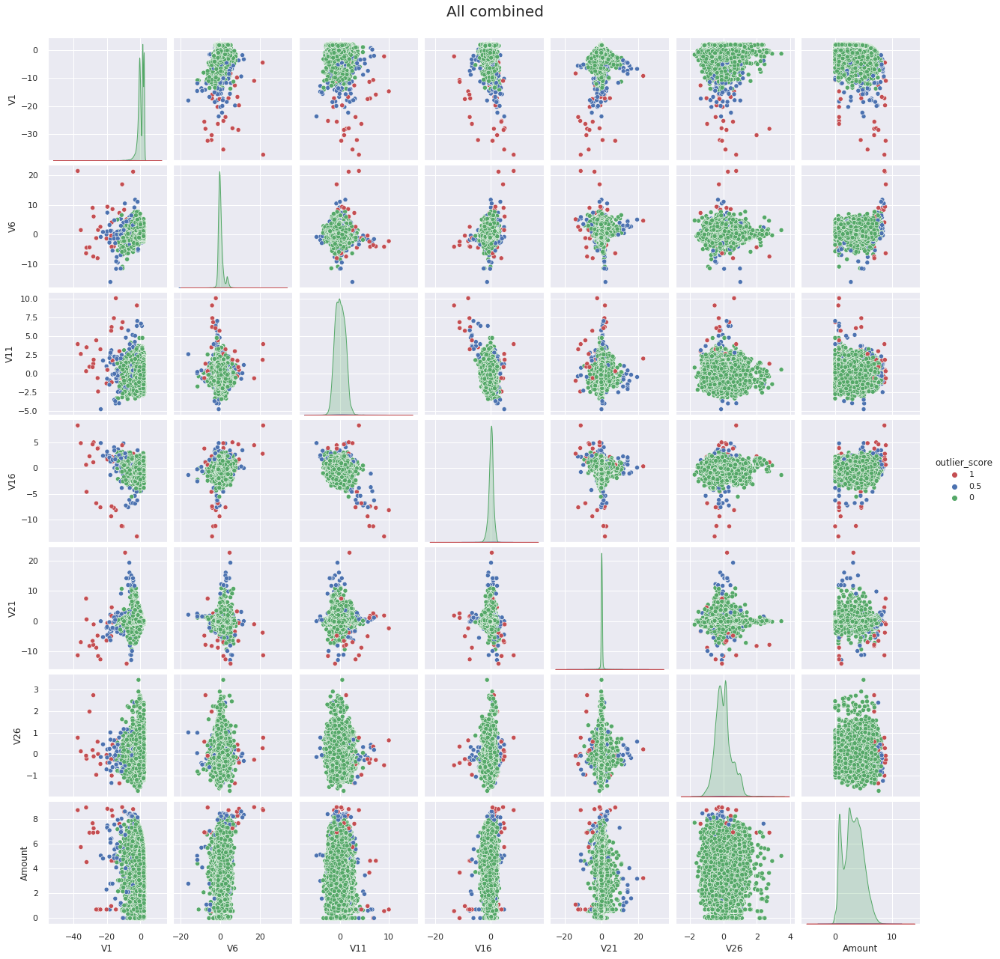

In [ ]:
simple_score = outliers_score.apply(
    lambda x: 0 if x < 0.2 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0: 'g', 0.5: 'b', 1.0: 'r'}

cols = ['V1', 'V6', 'V11', 'V16',
            'V21', 'V26', 'Amount']
featured_columns = cols.copy()
cols.append('outlier_score')

_ = sns.pairplot(data=labeled_data[cols],
                 vars=featured_columns, hue='outlier_score',
                 hue_order=[1, 0.5, 0], 
                 palette=custom_palette)
plt.suptitle("All combined", y=1.02, fontsize=20)
plt.show()

#### Quality check - all models average

Confusion matrix:

[[28302   133]
 [   15    30]]


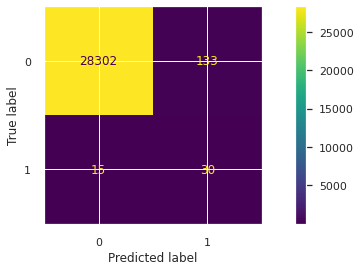


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.18      0.67      0.29        45

    accuracy                           0.99     28480
   macro avg       0.59      0.83      0.64     28480
weighted avg       1.00      0.99      1.00     28480



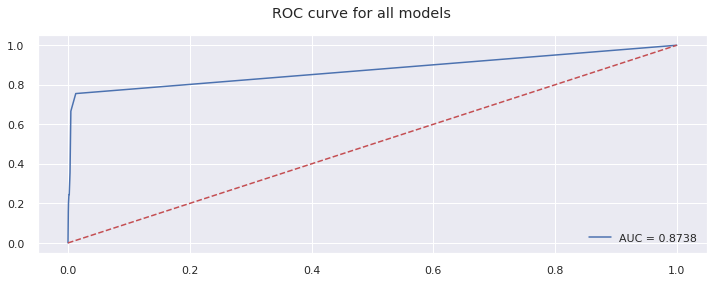

In [ ]:
final_score = np.array([1 if outliers_score.iloc[s] > 0.2 else 0 for s in outliers_score.index])
quality_check(data["Class"], final_score, "All models average")
# ROC_AUC
fpr, tpr, _ = roc_curve(data["Class"], outliers_score)
auc = roc_auc_score(data["Class"],  outliers_score)
plt.plot(fpr, tpr, label=f"AUC = {str(round(auc,4))}")
plt.plot([0, 1], [0, 1],'r--')
plt.suptitle("ROC curve for all models")
plt.legend(loc=4)
plt.show()

In [ ]:
visualize_2d(labeled_data, final_score,
             title="All models average")

### Only model-based

Mean outliers score for the dataset: 0.0045


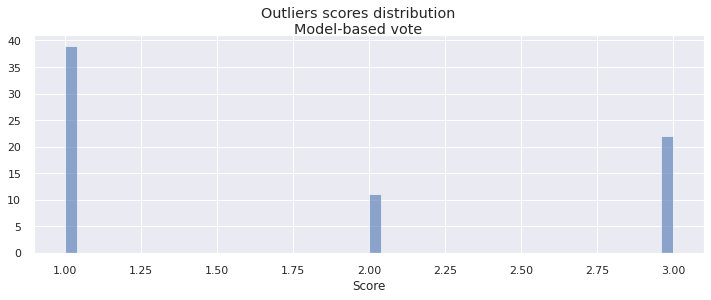

In [ ]:
outliers_score_model_based = np.array(summary[[
    'DBSCAN', "OCSVM", "iForest"]].sum(axis=1))#'dbscan', 
all_non_zero = outliers_score_model_based[outliers_score_model_based > 0]
_ = plt.hist(all_non_zero, bins=50, alpha=0.6)
plt.suptitle("Outliers scores distribution\nModel-based vote")
plt.xlabel("Score")
print(f"Mean outliers score for the dataset: {np.mean(outliers_score_model_based):.4f}")

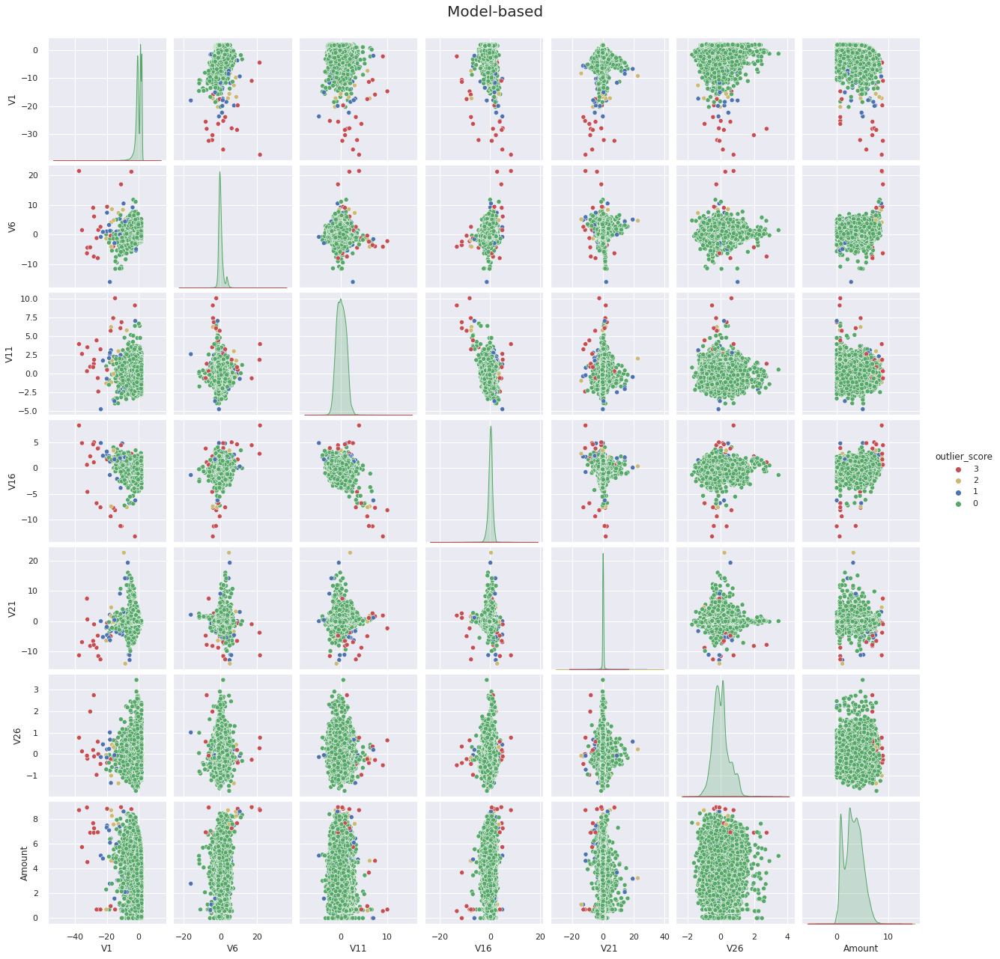

In [ ]:
labeled_data = data_features.copy()
labeled_data['outlier_score'] = outliers_score_model_based

custom_palette = {0: 'g', 1: 'b', 2: 'y', 3: 'r'}

cols = ['V1', 'V6', 'V11', 'V16',
            'V21', 'V26', 'Amount']
featured_columns = cols.copy()
cols.append('outlier_score')

_ = sns.pairplot(data=labeled_data[cols],
                 vars=featured_columns, hue='outlier_score',
                 hue_order=[3, 2, 1, 0], 
                 palette=custom_palette)
plt.suptitle("Model-based", y=1.02, fontsize=20)
plt.show()

#### Quality check - model-based

Confusion matrix:

[[28377    58]
 [   31    14]]


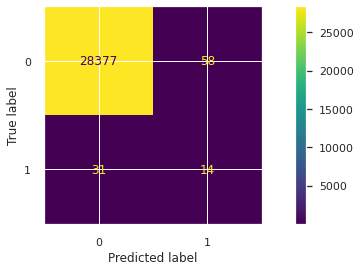


-----------------------------------------------------

Classification report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     28435
         1.0       0.19      0.31      0.24        45

    accuracy                           1.00     28480
   macro avg       0.60      0.65      0.62     28480
weighted avg       1.00      1.00      1.00     28480



In [ ]:
final_score_model_based = [1 if outliers_score_model_based[s] > 0.5 else 0 for s in range(outliers_score_model_based.size)]
quality_check(data["Class"], final_score_model_based, "Model-based vote")

In [ ]:
visualize_2d(labeled_data, np.array(final_score_model_based),
             title="Model-based vote")

## Comparison of results - classification reports

In [ ]:
# from IPython.display import HTML

# def hover(hover_color="#FFA500"):
#     return dict(selector="td:hover",
#                 props=[("background-color", "%s" % hover_color)])

def classif_reports(crs_dict):
    """
    Argument:
    dictionary {name: classification report}
    
    Returns:
    dataframe with all classification reports
    """
    results = pd.DataFrame.from_dict(crs_dict)
    df_temp=pd.DataFrame(np.diag(results), index=[results.columns, results.index])
    df_temp.index = df_temp.index.droplevel(1)
    df = df_temp.T
    subcols = ["", "precision", "recall", "f1-score", "support"]
    lvl1 = [list(k.keys())[0] for k in crs_dict]
    mc = pd.DataFrame(columns=pd.MultiIndex.from_product([lvl1, subcols]))
    
    for c in list(mc.columns.levels)[0]:
        lst = df.loc[0, c].split()
        lst = lst[4:]
        lst[13] = lst[13] + " " + lst[14]
        lst.pop(14)
        lst[18] = lst[18] + " " + lst[19]
        lst.pop(19)
        lst.insert(11,"")
        lst.insert(12,"")
        for r in range(5):
            mc.loc[r, c] = lst[r*len(lst)//5:r*len(lst)//5+5] 
    styles = [
    dict(selector="td", props=[("font-size", "95%"),
                               ("text-align", "center")]),
    dict(selector="td:hover", props=[("background-color", "orange")])]
    subset=['IQR','Cityblock distance', 'iForest', 'Model-based vote']
    # subset=[]
    html = (mc.style.hide_index().\
            set_table_styles(styles).\
            set_properties(**{'background-color': '#e0e0e0'},\
            subset=subset))
    
    return html

classif_reports(crs)